# Урок 8. GAN
# Домашнее задание

### <span class="burk">Задание 1.</span>
**Попробуйте улучшить работу нейронной сети, рассмотренной в методическом пособии.
Приложите анализ и лучшее сгенерированное изображение к уроку. Обратите внимание:
для запуска нейронной сети понадобиться tensorflow 2.1.0 и минимум 8gb опер. памяти
(если запускать на процессоре).**

#### Библиотеки

In [ ]:
!pip install -q git+https://github.com/tensorflow/examples.git

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix

import os
import time
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm_notebook as tqdm

#### Данные

In [ ]:
dataset, metadata = tfds.load('cycle_gan/horse2zebra',
                              with_info=True, as_supervised=True)

train_horses, train_zebras = dataset['trainA'], dataset['trainB']
test_horses, test_zebras = dataset['testA'], dataset['testB']

In [ ]:
BUFFER_SIZE = 5000
BATCH_SIZE = 4
IMG_WIDTH = 256
IMG_HEIGHT = 256

def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3])
  return cropped_image

# normalizing the images to [-1, 1]
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

def random_jitter(image):
  # resizing to 286 x 286 x 3
  image = tf.image.resize(image, [286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  # randomly cropping to 256 x 256 x 3
  image = random_crop(image)

  # random mirroring
  image = tf.image.random_flip_left_right(image)

  return image

def preprocess_image_train(image, label):
  image = random_jitter(image)
  image = normalize(image)
  return image

def preprocess_image_test(image, label):
  image = normalize(image)
  return image


In [ ]:
train_horses = train_horses.map(
    preprocess_image_train).cache().shuffle(BUFFER_SIZE).batch(4)

train_zebras = train_zebras.map(
    preprocess_image_train).cache().shuffle(BUFFER_SIZE).batch(4)

test_horses = test_horses.map(
    preprocess_image_test).cache().shuffle(BUFFER_SIZE).batch(4)

test_zebras = test_zebras.map(
    preprocess_image_test).cache().shuffle(BUFFER_SIZE).batch(4)

#### Пример

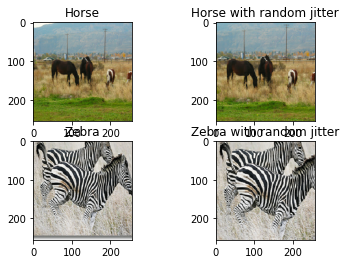

In [ ]:
sample_horse = next(iter(train_horses))
sample_zebra = next(iter(train_zebras))

plt.subplot(221)
plt.title('Horse')
plt.imshow(sample_horse[0] * 0.5 + 0.5)

plt.subplot(222)
plt.title('Horse with random jitter')
plt.imshow(random_jitter(sample_horse[0]) * 0.5 + 0.5)
plt.subplot(223)
plt.title('Zebra')
plt.imshow(sample_zebra[0] * 0.5 + 0.5)

plt.subplot(224)
plt.title('Zebra with random jitter')
plt.imshow(random_jitter(sample_zebra[0]) * 0.5 + 0.5)

#### Модели

In [ ]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

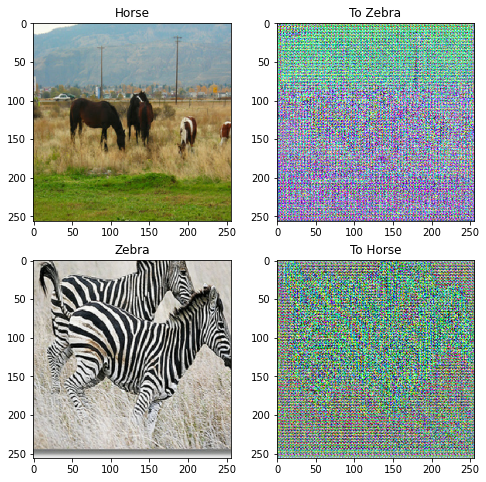

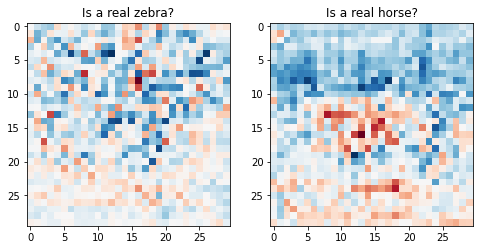

In [ ]:
to_zebra = generator_g(sample_horse)
to_horse = generator_f(sample_zebra)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_horse, to_zebra, sample_zebra, to_horse]
title = ['Horse', 'To Zebra', 'Zebra', 'To Horse']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real zebra?')
plt.imshow(discriminator_y(sample_zebra)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real horse?')
plt.imshow(discriminator_x(sample_horse)[0, ..., -1], cmap='RdBu_r')

plt.show()

#### Функция потерь

In [ ]:
LAMBDA = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)
  generated_loss = loss_obj(tf.zeros_like(generated), generated)
  total_disc_loss = real_loss + generated_loss
  return total_disc_loss * 0.5

def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  return LAMBDA * loss1

def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

#### Оптимизаторы для обучения

In [ ]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

#### Checkpoints

Сохранение промежуточных результатов для того, чтобы при необходимости можно было продолжить обучение, а не начинать сначала.

In [ ]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

#### Обучение

In [ ]:
EPOCHS = 25

def generate_images(model, test_input):
  prediction = model(test_input)
    
  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()


Несмотря на то, что тренировочный процесс у GAN более сложный, он состоит из тех же этапов, что обычно:
*   Получить предсказание
*   Вычислить ошибку
*   Посчитать градиенты, используя обратное распространения ошибки
*   Применить градиенты для оптимайзера


In [ ]:
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.
    
    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)
    
    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
    
    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
  
  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables)
  
  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)
  
  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))
  
  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))
  
  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

  0%|          | 0/267 [00:00<?, ?it/s]

...........................

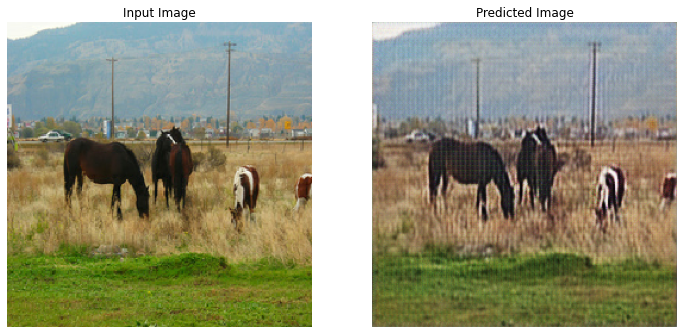

Time taken for epoch 1 is 430.2025933265686 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

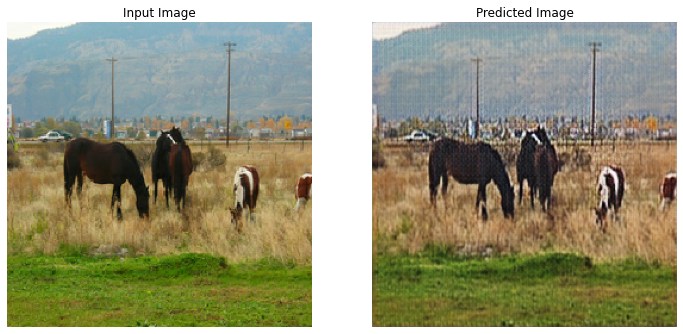

Time taken for epoch 2 is 442.30165433883667 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

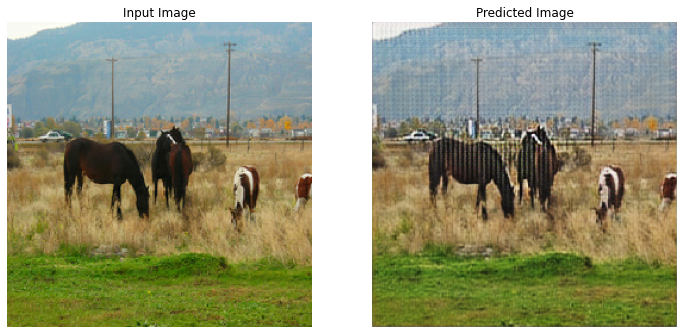

Time taken for epoch 3 is 442.2964196205139 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

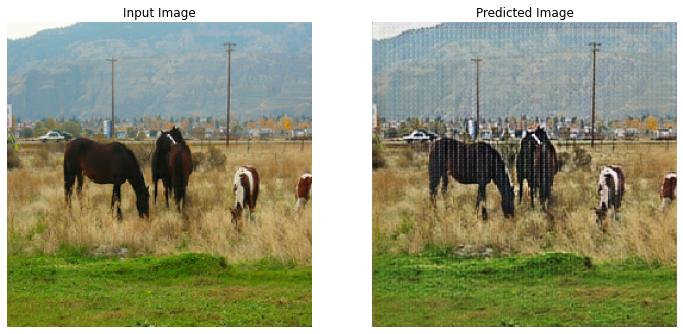

Time taken for epoch 4 is 442.2840769290924 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

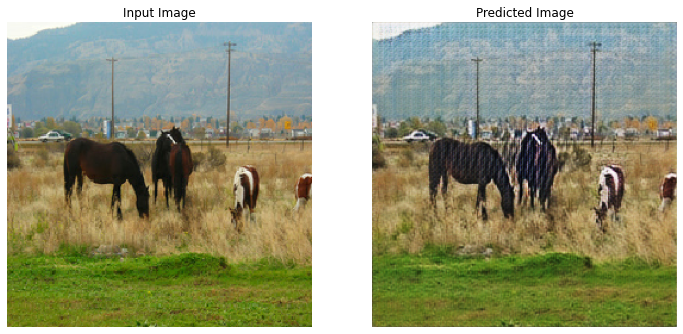

Saving checkpoint for epoch 5 at ./checkpoints/train/ckpt-1
Time taken for epoch 5 is 424.7477035522461 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

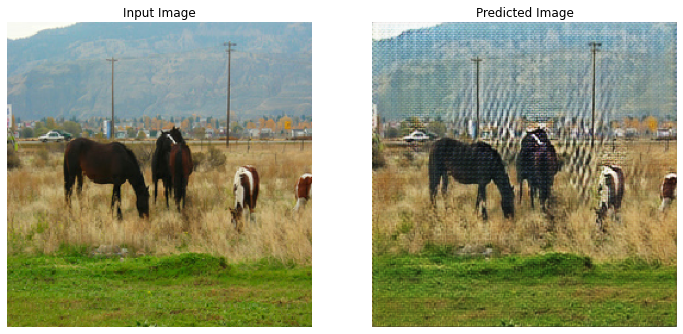

Time taken for epoch 6 is 442.3290104866028 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

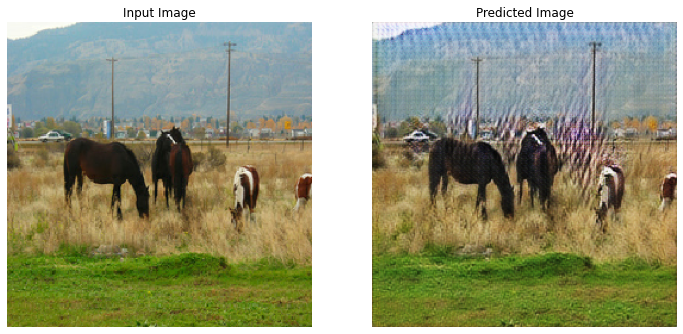

Time taken for epoch 7 is 418.64664673805237 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

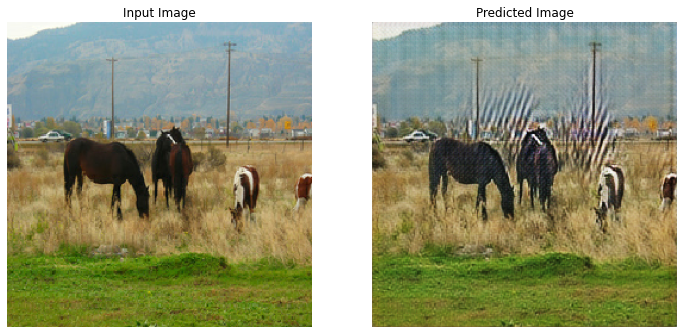

Time taken for epoch 8 is 442.4130449295044 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

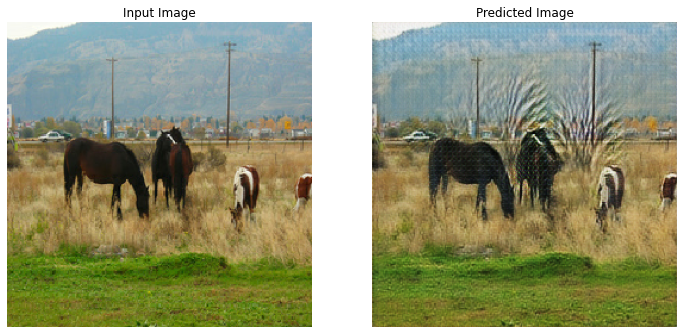

Time taken for epoch 9 is 419.91857743263245 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

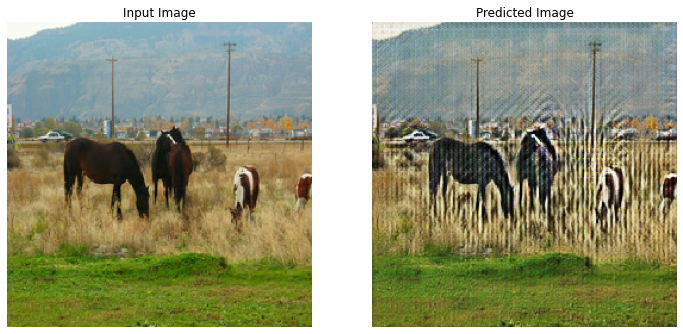

Saving checkpoint for epoch 10 at ./checkpoints/train/ckpt-2
Time taken for epoch 10 is 426.9357843399048 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

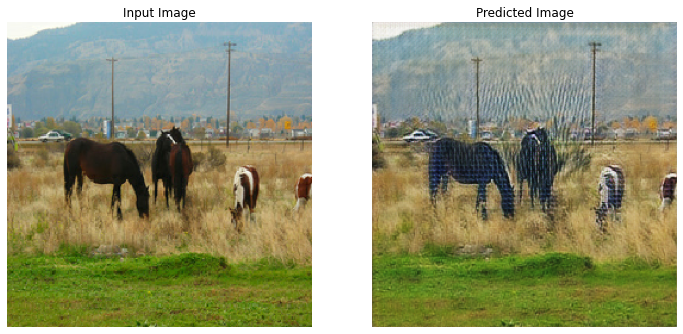

Time taken for epoch 11 is 442.4048466682434 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

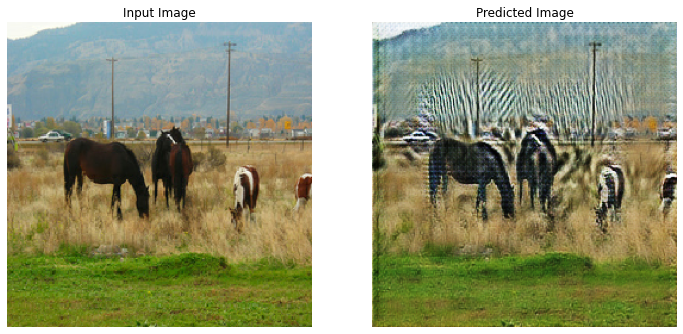

Time taken for epoch 12 is 442.3786358833313 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

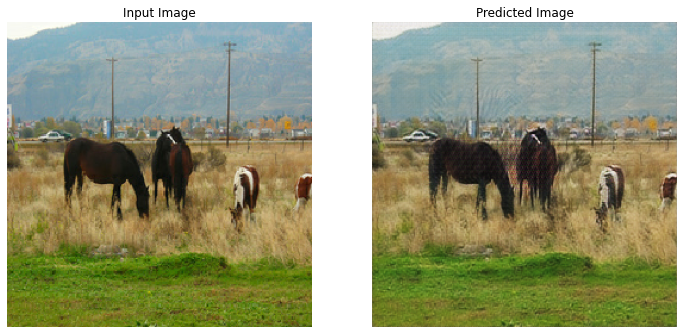

Time taken for epoch 13 is 442.4258186817169 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

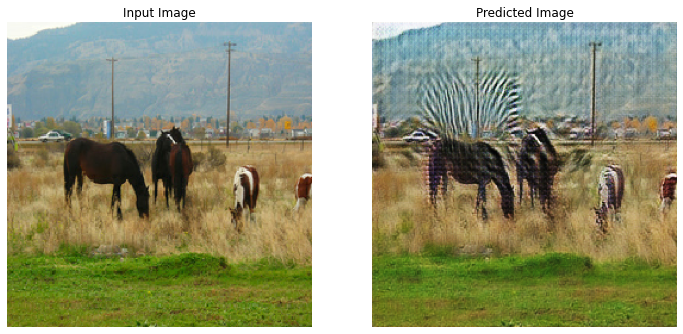

Time taken for epoch 14 is 424.18130373954773 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

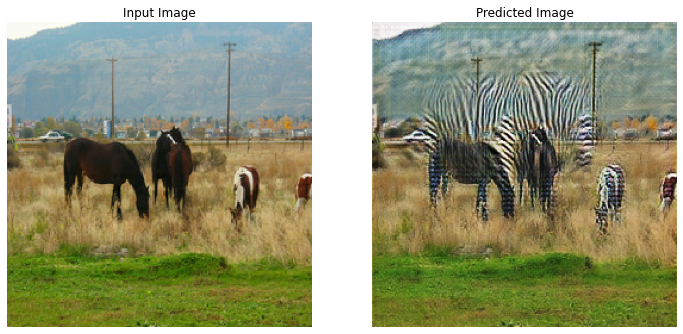

Saving checkpoint for epoch 15 at ./checkpoints/train/ckpt-3
Time taken for epoch 15 is 432.23300886154175 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

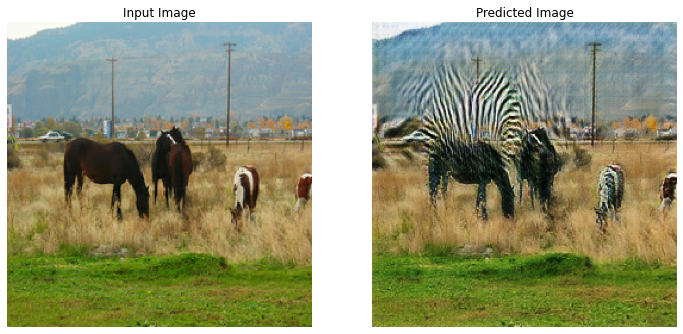

Time taken for epoch 16 is 442.38551235198975 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

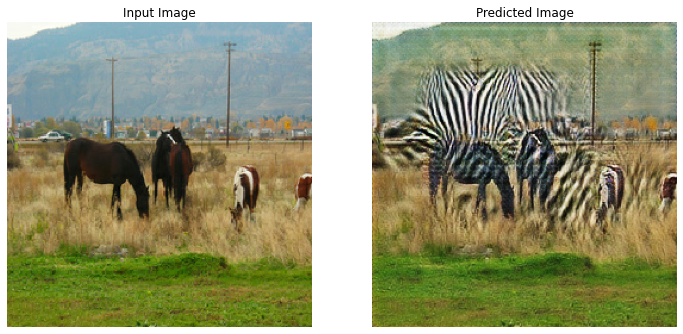

Time taken for epoch 17 is 427.1531481742859 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

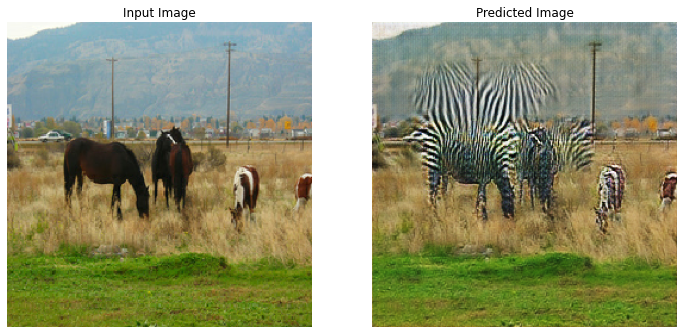

Time taken for epoch 18 is 442.4103467464447 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

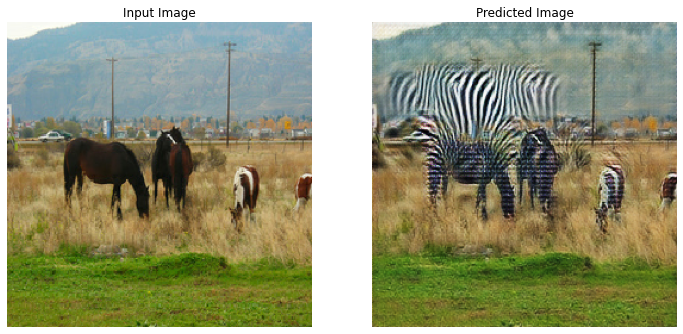

Time taken for epoch 19 is 428.17710161209106 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

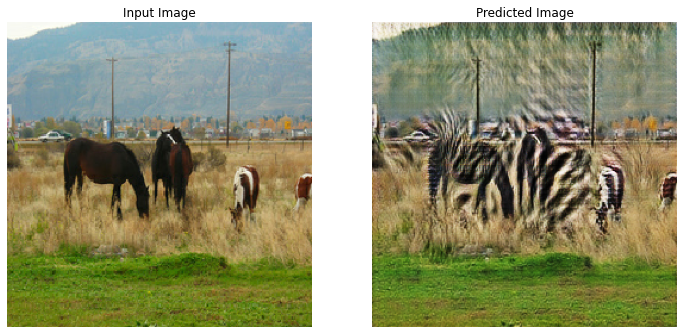

Saving checkpoint for epoch 20 at ./checkpoints/train/ckpt-4
Time taken for epoch 20 is 436.0277452468872 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

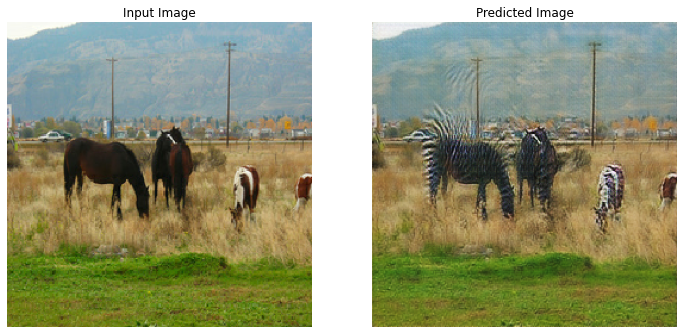

Time taken for epoch 21 is 442.44154715538025 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

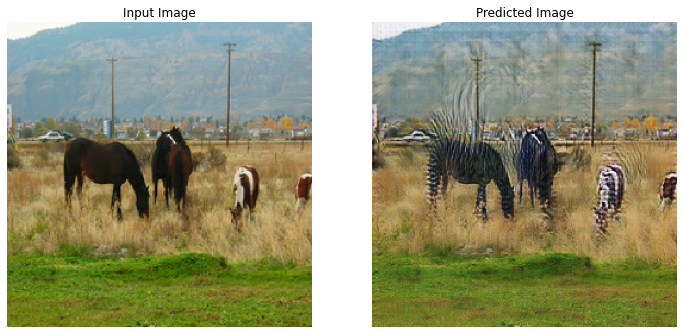

Time taken for epoch 22 is 430.9055256843567 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

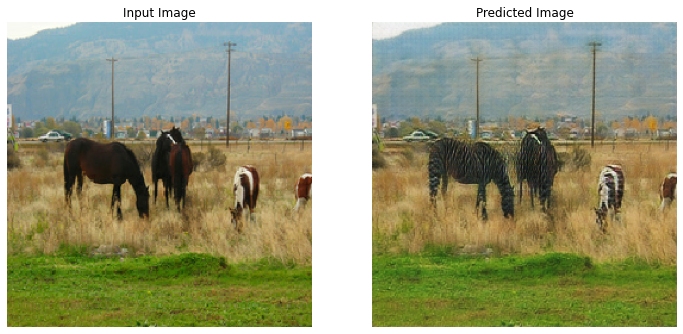

Time taken for epoch 23 is 442.4542577266693 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

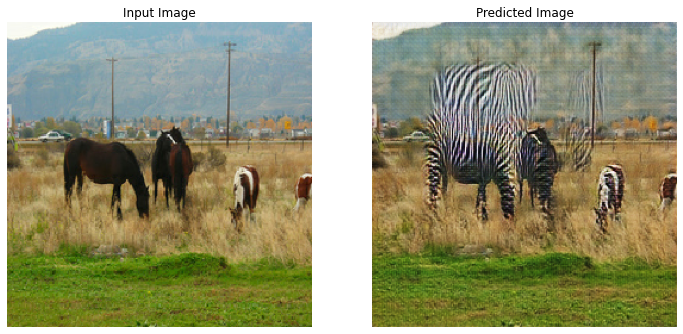

Time taken for epoch 24 is 432.1356098651886 sec



  0%|          | 0/267 [00:00<?, ?it/s]

...........................

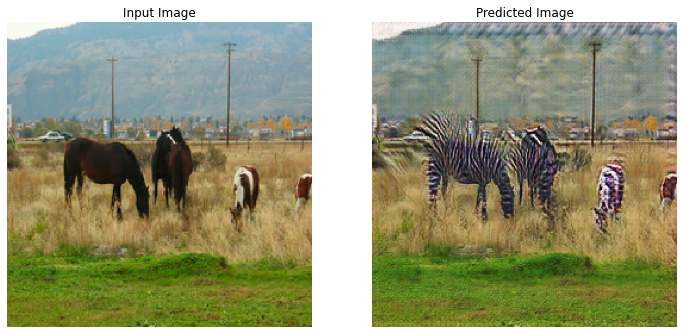

Saving checkpoint for epoch 25 at ./checkpoints/train/ckpt-5
Time taken for epoch 25 is 448.63463950157166 sec



In [ ]:
for epoch in range(EPOCHS):
  start = time.time()

  n = 0
  for data in tqdm(tf.data.Dataset.zip((train_horses, train_zebras))):
    image_x, image_y = data
    train_step(image_x, image_y)
    if n % 10 == 0:
      print ('.', end='')
    n+=1

  # Using a consistent image (sample_horse) so that the progress of the model
  # is clearly visible.
  generate_images(generator_g, sample_horse)

  if (epoch + 1) % 5 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))


#### Тест

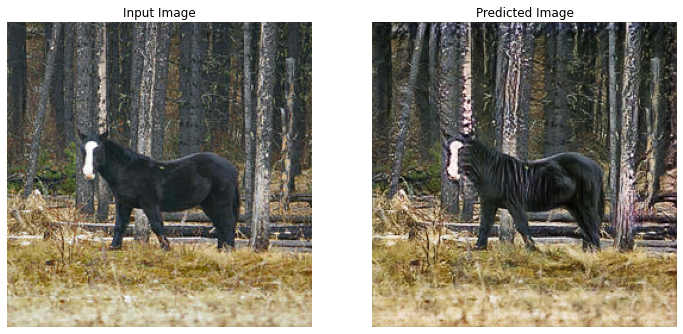

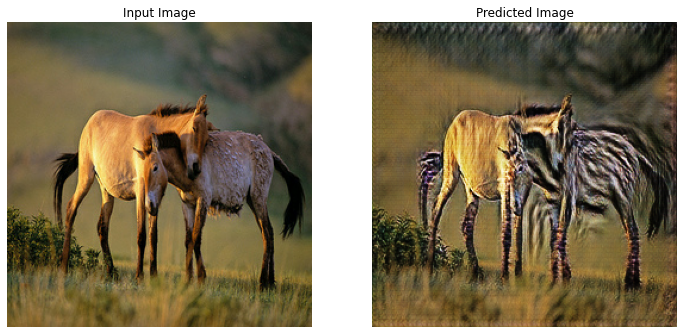

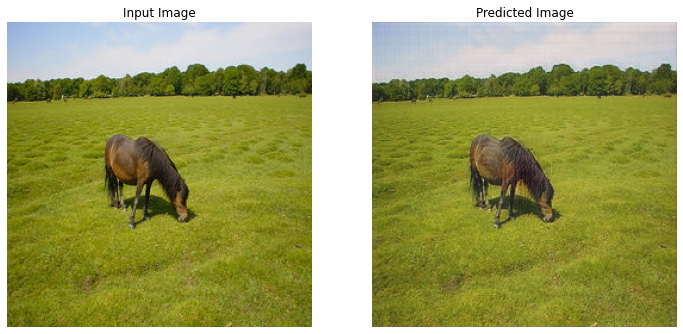

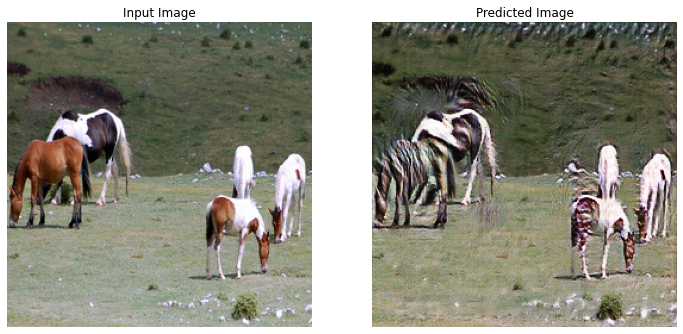

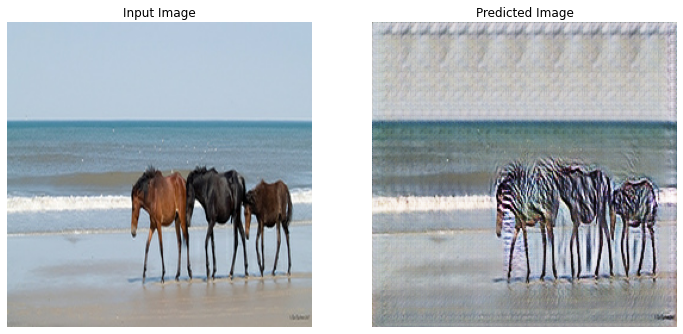

In [ ]:
# Run the trained model on the test dataset
for inp in test_horses.take(5):
  generate_images(generator_g, inp)


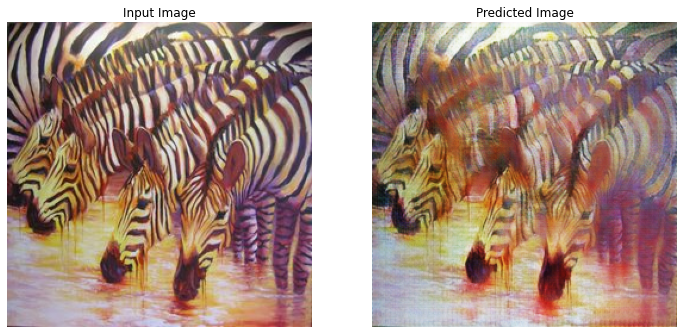

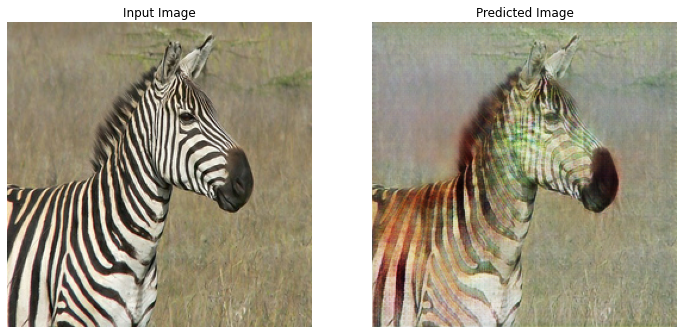

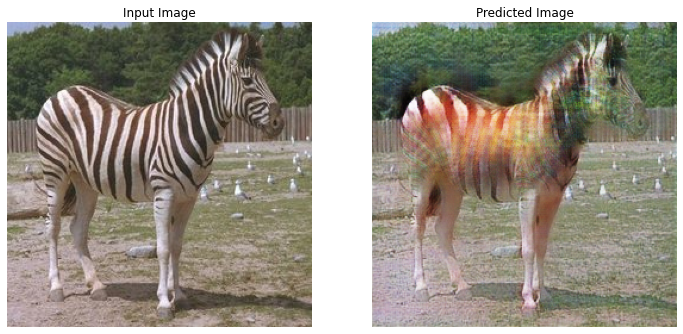

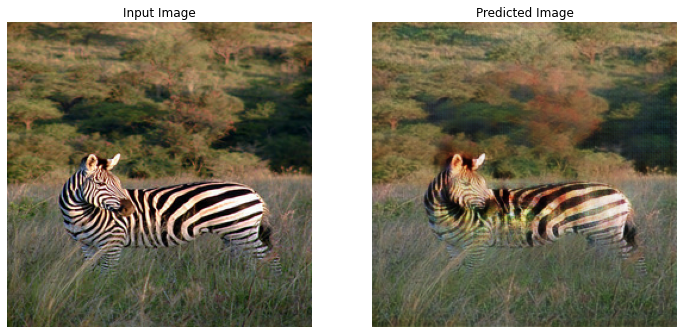

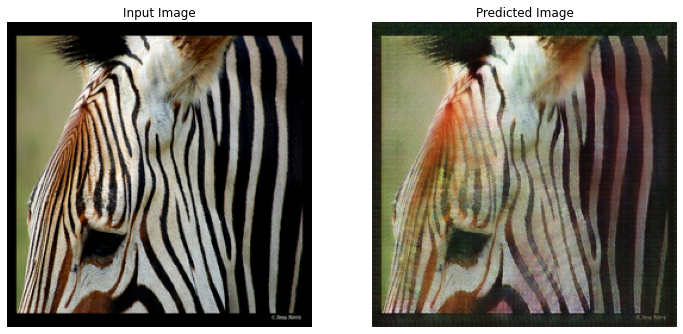

In [ ]:
# Run the trained model on the test dataset
for inp in test_zebras.take(5):
  generate_images(generator_f, inp)

### <span class="girk">Выводы:</span>  
 1. Изменял размер batch'а - сначала до, потом 4. Пробовал до 8, но тогда ```Colab``` падает на 1 эпохе из-за лимита ОЗУ
 2. Увеличил BUFFER SIZE до 5000 по этапно. Пробовал ставить 8000 - ```Colab``` упал.
 3. Тренировал на 15 эпохах результат не плохой. Сделал 25 - результат лучше. Если увеличить количество эпох до 50 возможно будет супер результат, но тогда обучение слишком долго будет. При текущих параметрах каждая эпоха занимала $> 7$ минут, каждая итерация $\approx 1.5$ секунды. При BUFFER SIZE 1000 - 3000 на итерацию уходило около секунды